This notebook runs in the bayesian conda environment.  
It is the only notebook that does that.  
Exit the notebook and close the Jupyter notebook/lab server.    
Run the following:  
`conda env create -f conda_env_for_bayesian_models_of_faith_pd.yml`  
`conda activate bayesian`  
`jupyter lab`  or `jupyter notebook`  
  
This analysis and the conda environment were very greatly assisted by this repository:  
[bayesian-analysis-recipes](https://github.com/ericmjl/bayesian-analysis-recipes)

In [1]:
import pymc3 as pm
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import janitor as jn
#from utils import ecdf
from sklearn.preprocessing import LabelEncoder
from itertools import combinations
import numpy as np
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerPatch
from scipy.stats import mannwhitneyu, mode

%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Faith PD
## Read Faith PD of "raw-swab" and "skin-corrected" samples and assign to family and stream

In [2]:
faith_pd_swab_fp = '/home/amir/JordanFishSkinMicrobiome/diversity-swab/faith_pd_vector.qza'
qza = faith_pd_swab_fp
a = !unzip $qza
digest = a[1].split('/')[0].replace('  inflating: ','')
inf = digest + '/data/alpha-diversity.tsv'
faith_pd_swab = pd.read_csv(inf,index_col=0,sep='\t')
!rm -r $digest

faith_pd_skin_fp = '/home/amir/JordanFishSkinMicrobiome/diversity-skin/faith_pd_vector.qza'
qza = faith_pd_skin_fp
a = !unzip $qza
digest = a[1].split('/')[0].replace('  inflating: ','')
inf = digest + '/data/alpha-diversity.tsv'
faith_pd_skin = pd.read_csv(inf,index_col=0,sep='\t')
!rm -r $digest

metadata_fp = '/home/amir/JordanFishSkinMicrobiome/fish_samples_metadata_loc_code_correct_sp.tsv'
metadata = pd.read_csv(metadata_fp,index_col=0, sep='\t')

columns = ['Sample','Fraction','Stream','Family/Tribe','Faith PD']

tidy = pd.DataFrame(columns=columns)

include = {
    'Cyprinidae',
    'Haplochrominae',
    'Nemacheilidae',
    'Tilapiinae'
}

for ind, row in faith_pd_swab.iterrows():
    if metadata.at[ind,'family_or_tribe'] not in include:
        continue
    if ind not in metadata.index.tolist():
        continue
    if ind in faith_pd_swab.index.tolist():
        tidy.loc[len(tidy)] = [
            ind,
            'Swab',
            metadata.at[ind,'Stream'],
            metadata.at[ind,'family_or_tribe'],
            faith_pd_swab.at[ind,'faith_pd']
        ]
for ind, row in faith_pd_skin.iterrows():
    if metadata.at[ind,'family_or_tribe'] not in include:
        continue
    if ind not in metadata.index.tolist():
        continue
    if ind in faith_pd_skin.index.tolist():
        tidy.loc[len(tidy)] = [
            ind,
            'Skin',
            metadata.at[ind,'Stream'],
            metadata.at[ind,'family_or_tribe'],
            faith_pd_skin.at[ind,'faith_pd']
        ]
        
tidy

,Sample,Fraction,Stream,Family/Tribe,Faith PD
0,AS102,Swab,H,Nemacheilidae,6.959337
1,AS103,Swab,H,Nemacheilidae,7.658721
2,AS105,Swab,H,Cyprinidae,7.176478
3,AS107,Swab,H,Cyprinidae,7.231545
4,AS111,Swab,H,Cyprinidae,5.197583
...,...,...,...,...,...
207,AS71,Skin,T,Tilapiinae,2.815187
208,AS75,Skin,A,Tilapiinae,2.447368
209,AS78,Skin,A,Haplochrominae,2.532140
210,AS84,Skin,A,Haplochrominae,2.848086


## Slice to Swab and Skin

In [3]:
#mine
continuous_cols = ["Faith PD"]
for c in continuous_cols:
    tidy[c] = pm.floatX(tidy[c])
    
tidy_swab = tidy.loc[tidy.Fraction=='Swab']

tidy_swab = tidy_swab.label_encode('Stream')
tidy_swab = tidy_swab.label_encode('Family/Tribe')

tidy_skin = tidy.loc[tidy.Fraction=='Skin']
tidy_skin = tidy_skin.label_encode('Stream')
tidy_skin = tidy_skin.label_encode('Family/Tribe')

/home/amir/anaconda2/envs/bayesian/lib/python3.6/site-packages/janitor/functions.py:530: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"{column_names}_enc"] = le.fit_transform(df[column_names])


### Model Swab Faith PD distribution in Families and sample

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu, sigma_Haplochrominae, mu_Haplochrominae, sigma_Tilapiinae, mu_Tilapiinae, sigma_Cyprinidae, mu_Cyprinidae, sigma_Nemacheilidae, mu_Nemacheilidae]
Sampling 4 chains: 100%|██████████| 44800/44800 [00:24<00:00, 1812.32draws/s]


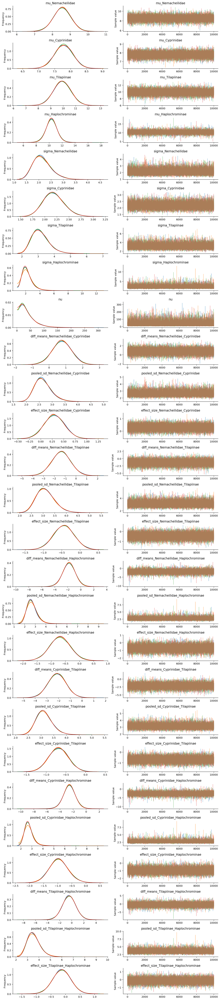

In [4]:
with pm.Model() as kruschke_model_swab:
    
    params = {
        'mu': {},
        'sigma': {}
    }
    
    for family in set(tidy_swab['Family/Tribe']):
        for param in params:
            name = '%s_%s' % (param, family)
            if param == 'mu':
                params[param][family] = pm.Normal(name, mu=5, sd=5 ** 2)
            else:
                params[param][family] = pm.HalfCauchy(name, beta=5)
                
    nu = pm.Exponential("nu", lam=1 / 29) + 1

    family_likes = {}
    
    for family in set(tidy_swab['Family/Tribe']):
        family_likes[family] = pm.StudentT(
            family,
            nu=nu,
            mu=params['mu'][family],
            sd=params['sigma'][family],
            observed=tidy_swab.loc[tidy_swab['Family/Tribe']==family]['Faith PD'].tolist()
        )
    for pair in list(combinations(set(tidy_swab['Family/Tribe']),2)):
        diff_means = pm.Deterministic(
            "diff_means_%s_%s" % tuple(pair), 
            params['mu'][pair[0]] - params['mu'][pair[1]]
        )
        pooled_sd = pm.Deterministic(
            "pooled_sd_%s_%s" % tuple(pair),
            np.sqrt(np.power(params['sigma'][pair[0]], 2) + np.power(params['sigma'][pair[1]], 2) / 2)
        )
        effect_size = pm.Deterministic(
            "effect_size_%s_%s" % tuple(pair), diff_means / pooled_sd
        )

with kruschke_model_swab:
    kruschke_swab_trace_fam = pm.sample(10000, chains=4, tune=1200,target_accept=.90)

a = pm.traceplot(kruschke_swab_trace_fam)

### Model Skin Faith PD distribution in Families and sample

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu, sigma_Haplochrominae, mu_Haplochrominae, sigma_Tilapiinae, mu_Tilapiinae, sigma_Cyprinidae, mu_Cyprinidae, sigma_Nemacheilidae, mu_Nemacheilidae]
Sampling 4 chains: 100%|██████████| 480000/480000 [04:51<00:00, 1646.33draws/s]


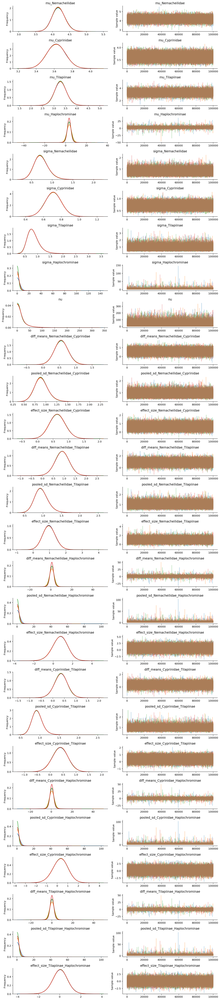

In [5]:
with pm.Model() as kruschke_model_skin:
    
    params = {
        'mu': {},
        'sigma': {}
    }
    
    for family in set(tidy_skin['Family/Tribe']):
        for param in params:
            name = '%s_%s' % (param, family)
            if param == 'mu':
                params[param][family] = pm.Normal(name, mu=5, sd=5 ** 2)
            else:
                params[param][family] = pm.HalfCauchy(name, beta=5)
                
    nu = pm.Exponential("nu", lam=1 / 29) + 1

    family_likes = {}
    
    for family in set(tidy_skin['Family/Tribe']):
        family_likes[family] = pm.StudentT(
            family,
            nu=nu,
            mu=params['mu'][family],
            sd=params['sigma'][family],
            observed=tidy_skin.loc[tidy_skin['Family/Tribe']==family]['Faith PD'].tolist()
        )
    for pair in list(combinations(set(tidy_skin['Family/Tribe']),2)):
        diff_means = pm.Deterministic(
            "diff_means_%s_%s" % tuple(pair), 
            params['mu'][pair[0]] - params['mu'][pair[1]]
        )
        pooled_sd = pm.Deterministic(
            "pooled_sd_%s_%s" % tuple(pair),
            np.sqrt(np.power(params['sigma'][pair[0]], 2) + np.power(params['sigma'][pair[1]], 2) / 2)
        )
        effect_size = pm.Deterministic(
            "effect_size_%s_%s" % tuple(pair), diff_means / pooled_sd
        )

with kruschke_model_skin:
    kruschke_skin_trace_fam = pm.sample(100000, chains=4, tune=20000,target_accept=.80)

a = pm.traceplot(kruschke_skin_trace_fam)

### Posterior distribution confidence interval of Faith PD Mu in Families

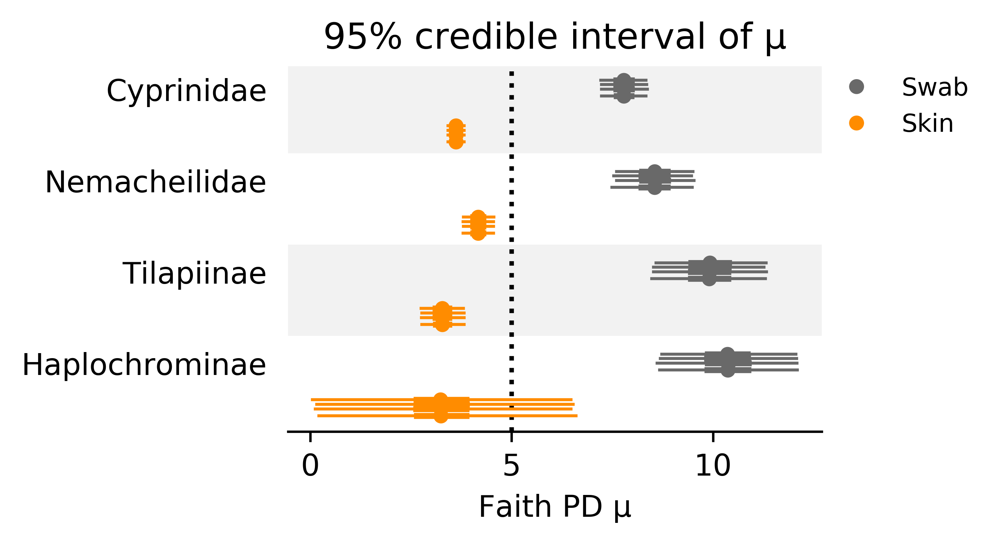

In [26]:
fig = plt.figure(figsize=(4,2), dpi=300)
gs = GridSpec(1, 1)
for ax in gs:
    fig.add_subplot(ax)

varnames = [
    'mu_Cyprinidae',
    'mu_Nemacheilidae',
    'mu_Tilapiinae',
    'mu_Haplochrominae'
]

pm.forestplot(
    [kruschke_swab_trace_fam, kruschke_skin_trace_fam], 
    varnames=varnames,
    rhat=False,
    models=['Swab','Skin'],
    colors=['dimgray','darkorange'],
    gs=gs,
    vline=5
)

ax1 = fig.axes[0]
    
labels = []
for label in [i.get_text() for i in ax1.get_yticklabels()]:
    if label.startswith('Swab'):
        labels.append(label.split('_')[1])
    else:
        labels.append('')
ax1.set_yticklabels(labels)


class HandlerCircle(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent
        p = mpatches.Circle(xy=center,radius=2)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]


# Extand legend to include bullets: 
handles, labels = ax1.get_legend_handles_labels()
for color in ['dimgray','darkorange']:
    handles += [mpatches.Circle([0.5,0.5],0.25,color=color)]
labels = ['Swab','Skin']

# Draw the legend
ax1.legend(handles, 
          labels,
          bbox_to_anchor=(1, 1),
          loc=2, 
          borderaxespad=0.,
          fontsize='small',
          frameon=False,
          handler_map={mpatches.Circle: HandlerCircle()}) 

ax1.set_title('95% credible interval of \N{GREEK SMALL LETTER MU}')
ax1.set_xlabel('Faith PD \N{GREEK SMALL LETTER MU}')

plt.savefig('/home/amir/JordanFishSkinMicrobiome/Figures/Faith_PD_Mu_of_families.png', bbox_inches='tight')

### Posterior distribution confidence interval of Faith PD Mu difference between Families

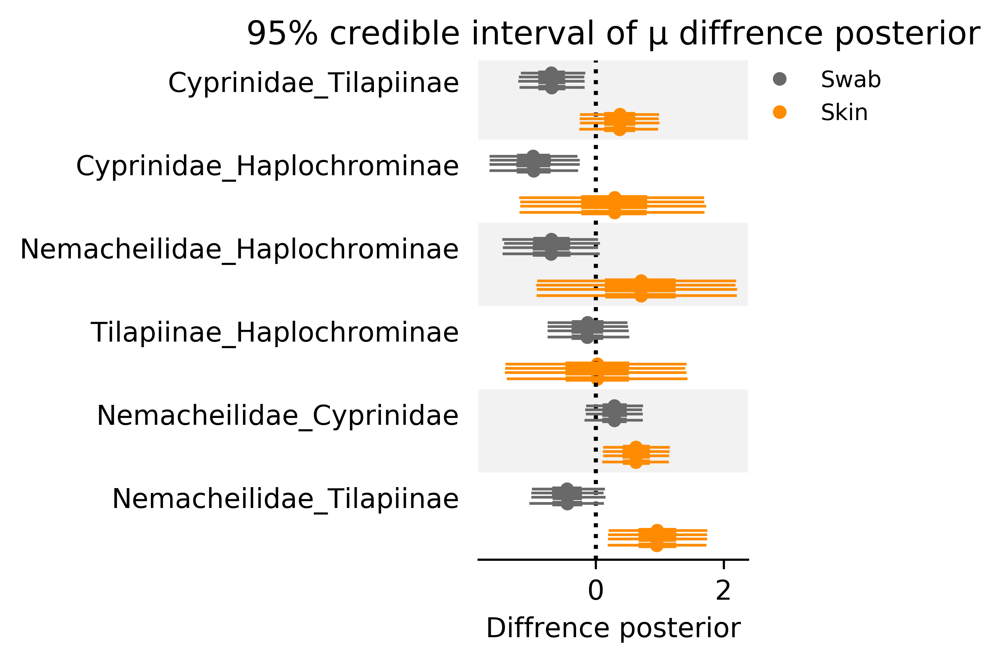

In [30]:
fig = plt.figure(figsize=(5,3), dpi=300)
gs = GridSpec(1, 1)
for ax in gs:
    fig.add_subplot(ax)

varnames = []

pairs = [
    'Tilapiinae_Cyprinidae',
    'Cyprinidae_Haplochrominae',
    'Nemacheilidae_Haplochrominae',
    'Tilapiinae_Haplochrominae',
    'Cyprinidae_Nemacheilidae',
    'Tilapiinae_Nemacheilidae'
]

for pair in pairs:
    a, b = pair.split('_')
    for var in kruschke_swab_trace_fam.varnames:
        if all([i in var for i in [a,b,'effect']]):
            varnames.append(var)

pm.forestplot(
    [kruschke_swab_trace_fam, kruschke_skin_trace_fam], 
    varnames=varnames,
    rhat=False,
    models=['Swab','Skin'],
    colors=['dimgray','darkorange'],
    gs=gs
)

ax2 = fig.axes[0]
    
labels = []
for label in [i.get_text() for i in ax2.get_yticklabels()]:
    if label.startswith('Swab'):
        labels.append(label.split('size_')[1])
    else:
        labels.append('')
ax2.set_yticklabels(labels)


class HandlerCircle(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent
        p = mpatches.Circle(xy=center,radius=2)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]


# Extand legend to include bullets: 
handles, labels = ax2.get_legend_handles_labels()
for color in ['dimgray','darkorange']:
    handles += [mpatches.Circle([0.5,0.5],0.25,color=color)]
labels = ['Swab','Skin']

# Draw the legend
ax2.legend(handles, 
          labels,
          bbox_to_anchor=(1, 1),
          loc=2, 
          borderaxespad=0.,
          fontsize='small',
          frameon=False,
          handler_map={mpatches.Circle: HandlerCircle()}) 

ax2.set_title('95% credible interval of \N{GREEK SMALL LETTER MU} diffrence posterior')
ax2.set_xlabel('Diffrence posterior')

plt.savefig('/home/amir/JordanFishSkinMicrobiome/Figures/Faith_PD_effect_size_in_families.png', bbox_inches='tight')

### Model Swab Faith PD distribution in Families and sample

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu, sigma_H, mu_H, sigma_T, mu_T, sigma_J, mu_J, sigma_A, mu_A, sigma_S, mu_S]
Sampling 4 chains: 100%|██████████| 44800/44800 [00:31<00:00, 1406.59draws/s]


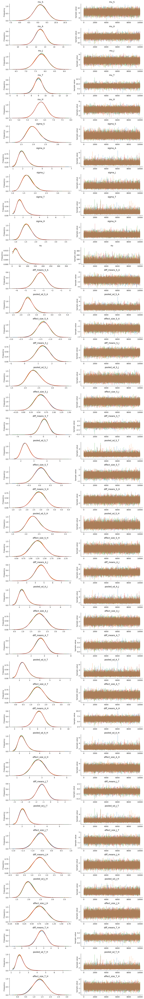

In [8]:
with pm.Model() as kruschke_model_swab:
    
    params = {
        'mu': {},
        'sigma': {}
    }
    
    for family in set(tidy_swab['Stream']):
        for param in params:
            name = '%s_%s' % (param, family)
            if param == 'mu':
                params[param][family] = pm.Normal(name, mu=5, sd=5 ** 2)
            else:
                params[param][family] = pm.HalfCauchy(name, beta=5)
                
    nu = pm.Exponential("nu", lam=1 / 29) + 1

    family_likes = {}
    
    for family in set(tidy_swab['Stream']):
        family_likes[family] = pm.StudentT(
            family,
            nu=nu,
            mu=params['mu'][family],
            sd=params['sigma'][family],
            observed=tidy_swab.loc[tidy_swab['Stream']==family]['Faith PD'].tolist()
        )
    for pair in list(combinations(set(tidy_swab['Stream']),2)):
        diff_means = pm.Deterministic(
            "diff_means_%s_%s" % tuple(pair), 
            params['mu'][pair[0]] - params['mu'][pair[1]]
        )
        pooled_sd = pm.Deterministic(
            "pooled_sd_%s_%s" % tuple(pair),
            np.sqrt(np.power(params['sigma'][pair[0]], 2) + np.power(params['sigma'][pair[1]], 2) / 2)
        )
        effect_size = pm.Deterministic(
            "effect_size_%s_%s" % tuple(pair), diff_means / pooled_sd
        )

with kruschke_model_swab:
    kruschke_swab_trace_stream = pm.sample(10000, chains=4, tune=1200,target_accept=.90)

a = pm.traceplot(kruschke_swab_trace_stream)

### Model Skin Faith PD distribution in Streams and sample

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [nu, sigma_H, mu_H, sigma_J, mu_J, sigma_T, mu_T, sigma_A, mu_A, sigma_S, mu_S]
Sampling 4 chains: 100%|██████████| 480000/480000 [04:49<00:00, 1657.19draws/s]


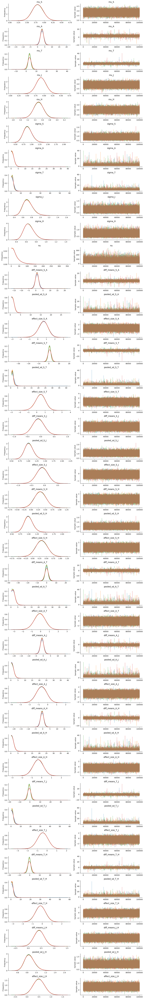

In [9]:
with pm.Model() as kruschke_model_skin:
    
    params = {
        'mu': {},
        'sigma': {}
    }
    
    for family in set(tidy_skin['Stream']):
        for param in params:
            name = '%s_%s' % (param, family)
            if param == 'mu':
                params[param][family] = pm.Normal(name, mu=5, sd=5 ** 2)
            else:
                params[param][family] = pm.HalfCauchy(name, beta=5)
                
    nu = pm.Exponential("nu", lam=1 / 29) + 1

    family_likes = {}
    
    for family in set(tidy_skin['Stream']):
        family_likes[family] = pm.StudentT(
            family,
            nu=nu,
            mu=params['mu'][family],
            sd=params['sigma'][family],
            observed=tidy_skin.loc[tidy_skin['Stream']==family]['Faith PD'].tolist()
        )
    for pair in list(combinations(set(tidy_skin['Stream']),2)):
        diff_means = pm.Deterministic(
            "diff_means_%s_%s" % tuple(pair), 
            params['mu'][pair[0]] - params['mu'][pair[1]]
        )
        pooled_sd = pm.Deterministic(
            "pooled_sd_%s_%s" % tuple(pair),
            np.sqrt(np.power(params['sigma'][pair[0]], 2) + np.power(params['sigma'][pair[1]], 2) / 2)
        )
        effect_size = pm.Deterministic(
            "effect_size_%s_%s" % tuple(pair), diff_means / pooled_sd
        )

with kruschke_model_skin:
    kruschke_skin_trace_stream = pm.sample(100000, chains=4, tune=20000,target_accept=.80)

a = pm.traceplot(kruschke_skin_trace_stream)

### Posterior distribution confidence interval of Faith PD Mu in Streams

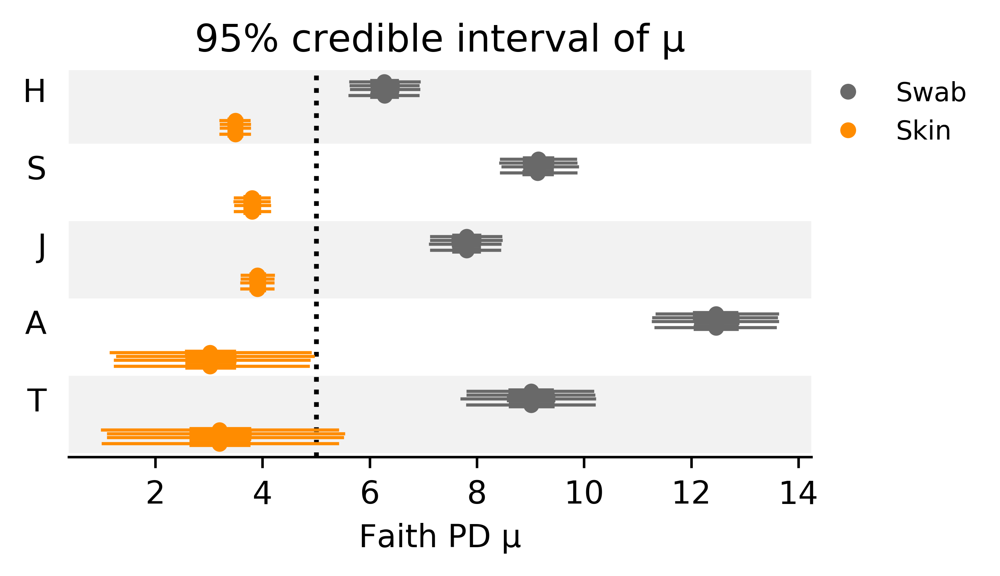

In [28]:
fig = plt.figure(figsize=(4,2), dpi=300)
gs = GridSpec(1, 1)
for ax in gs:
    fig.add_subplot(ax)

varnames = [
    'mu_H',
    'mu_S',
    'mu_J',
    'mu_A',
    'mu_T'
]

pm.forestplot(
    [kruschke_swab_trace_stream, kruschke_skin_trace_stream], 
    varnames=varnames,
    rhat=False,
    models=['Swab','Skin'],
    colors=['dimgray','darkorange'],
    gs=gs,
    vline=5
)

ax3 = fig.axes[0]
    
labels = []
for label in [i.get_text() for i in ax3.get_yticklabels()]:
    if label.startswith('Swab'):
        labels.append(label.split('_')[1])
    else:
        labels.append('')
ax3.set_yticklabels(labels)


class HandlerCircle(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent
        p = mpatches.Circle(xy=center,radius=2)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]


# Extand legend to include bullets: 
handles, labels = ax3.get_legend_handles_labels()
for color in ['dimgray','darkorange']:
    handles += [mpatches.Circle([0.5,0.5],0.25,color=color)]
labels = ['Swab','Skin']

# Draw the legend
ax3.legend(handles, 
          labels,
          bbox_to_anchor=(1, 1),
          loc=2, 
          borderaxespad=0.,
          fontsize='small',
          frameon=False,
          handler_map={mpatches.Circle: HandlerCircle()}) 

ax3.set_title('95% credible interval of \N{GREEK SMALL LETTER MU}')
ax3.set_xlabel('Faith PD \N{GREEK SMALL LETTER MU}')

plt.savefig('/home/amir/JordanFishSkinMicrobiome/Figures/Faith_PD_Mu_in_streams.png', bbox_inches='tight')

### Posterior distribution confidence interval of Faith PD Mu difference between Streams

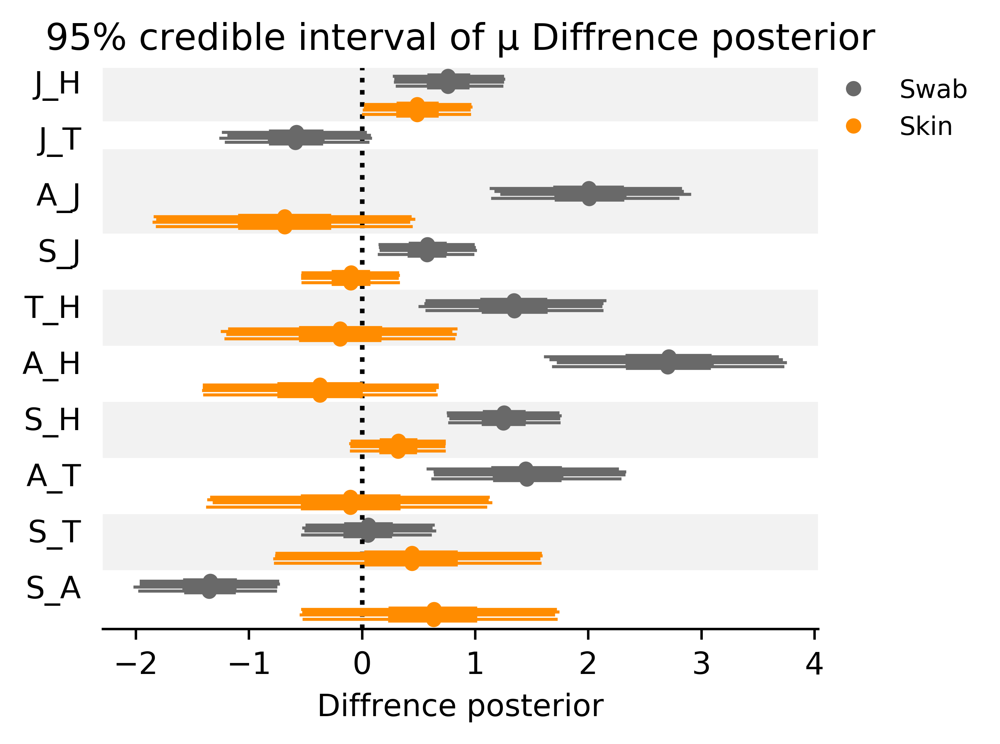

In [31]:
fig = plt.figure(figsize=(5,3), dpi=300)
gs = GridSpec(1, 1)
for ax in gs:
    fig.add_subplot(ax)

pairs = [
    'J_H',
    'J_T',
    'J_A',
    'J_S',
    'H_T',
    'H_A',
    'H_S',
    'T_A',
    'T_S',
    'A_S'
]

varnames = []

for pair in pairs:
    a, b = pair.split('_')
    for var in kruschke_swab_trace_stream.varnames:
        if all([i in var for i in [a,b,'effect']]):
            varnames.append(var)

pm.forestplot(
    [kruschke_swab_trace_stream, kruschke_skin_trace_stream], 
    varnames=varnames,
    rhat=False,
    models=['Swab','Skin'],
    colors=['dimgray','darkorange'],
    gs=gs
)

ax4 = fig.axes[0]
    
labels = []
for label in [i.get_text() for i in ax4.get_yticklabels()]:
    if label.startswith('Swab'):
        labels.append(label.split('size_')[1])
    else:
        labels.append('')
ax4.set_yticklabels(labels)


class HandlerCircle(HandlerPatch):
    def create_artists(self, legend, orig_handle,
                       xdescent, ydescent, width, height, fontsize, trans):
        center = 0.5 * width - 0.5 * xdescent, 0.5 * height - 0.5 * ydescent
        p = mpatches.Circle(xy=center,radius=2)
        self.update_prop(p, orig_handle, legend)
        p.set_transform(trans)
        return [p]


# Extand legend to include bullets: 
handles, labels = ax4.get_legend_handles_labels()
for color in ['dimgray','darkorange']:
    handles += [mpatches.Circle([0.5,0.5],0.25,color=color)]
labels = ['Swab','Skin']

# Draw the legend
ax4.legend(handles, 
          labels,
          bbox_to_anchor=(1, 1),
          loc=2, 
          borderaxespad=0.,
          fontsize='small',
          frameon=False,
          handler_map={mpatches.Circle: HandlerCircle()}) 

ax4.set_title('95% credible interval of \N{GREEK SMALL LETTER MU} Diffrence posterior')
ax4.set_xlabel('Diffrence posterior')

plt.savefig('/home/amir/JordanFishSkinMicrobiome/Figures/Faith_PD_effect_size_in_streams.png', bbox_inches='tight')

# Relative abundance

In [67]:
narrow3 = pd.read_pickle('Tables/Class_relative_abundances.pkl')
narrow3 = narrow3.loc[narrow3.ClassMean>0.01].sort_values('ClassMean', ascending=False)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 12 jobs)
NUTS: [nu, sigma, mu_swab_Bacteroidia, mu_swab_Alphaproteobacteria, mu_swab_Gammaproteobacteria, mu_swab_Fusobacteriia, mu_swab_Bacilli, mu_skin_Bacteroidia, mu_skin_Alphaproteobacteria, mu_skin_Gammaproteobacteria, mu_skin_Fusobacteriia, mu_skin_Bacilli, mu_water_Bacteroidia, mu_water_Alphaproteobacteria, mu_water_Gammaproteobacteria, mu_water_Fusobacteriia, mu_water_Bacilli]
Sampling 4 chains: 100%|██████████| 180000/180000 [04:40<00:00, 642.12draws/s]


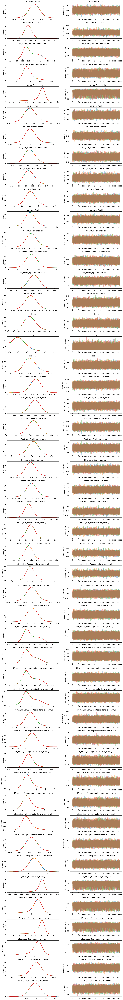

In [57]:
fractions = ['water','skin','swab']
classes = ['Bacilli','Fusobacteriia','Gammaproteobacteria','Alphaproteobacteria','Bacteroidia']

mus = []

for fraction in fractions:
    for c in classes:
        mus.append((fraction,c))
        
comparisons = {c: list(combinations(fractions,2)) for c in classes}
        
with pm.Model() as model:
    
    params = {
        'mu': {},
        'sigma': {}
    }
    
    for mu in mus:
        name = '%s_%s' % mu
        params['mu'][name] = pm.Normal(
            'mu_'+name, 
            mu=narrow3.loc[((narrow3.Type==mu[0])&(narrow3.Class==mu[1]))]['RelAbund'].mean(),
            sd=narrow3.loc[((narrow3.Type==mu[0])&(narrow3.Class==mu[1]))]['RelAbund'].std()
        )
    sigma = pm.HalfCauchy(
        'sigma',
        beta=0.5
    )
                
    nu = pm.Exponential("nu", lam=1 / 29) + 1

    mu_likes = {}
    
    for mu in mus:
        name = '%s_%s' % mu
        data = narrow3.loc[((narrow3.Type==mu[0]) & (narrow3.Class==mu[1]))]
        if len(data) < 10:
            continue
        mu_likes[name] = pm.StudentT(
            name,
            nu=nu,
            mu=params['mu'][name],
            sd=sigma,
            observed=data['RelAbund'].tolist()
        )
        
    pooled_sd = pm.Deterministic(
        "pooled_sd",
        np.sqrt(np.power(sigma, 2) + np.power(sigma, 2) / 2)
    )
        
    for c in comparisons:
        for fractions in comparisons[c]:
            name = "%s_%s_%s" % (c, fractions[0], fractions[1])
            name1 = "%s_%s" % (fractions[0],c)
            name2 = "%s_%s" % (fractions[1],c)
            diff_means = pm.Deterministic(
                "diff_means_%s" % name, 
                params['mu'][name1] - params['mu'][name2]
            )
            effect_size = pm.Deterministic(
                "effect_size_%s" % name, diff_means / pooled_sd
            )

with model:
    trace = pm.sample(40000, chains=4, tune=5000,target_accept=.90,cores=12)

a = pm.traceplot(trace)


GridSpec(1, 1)

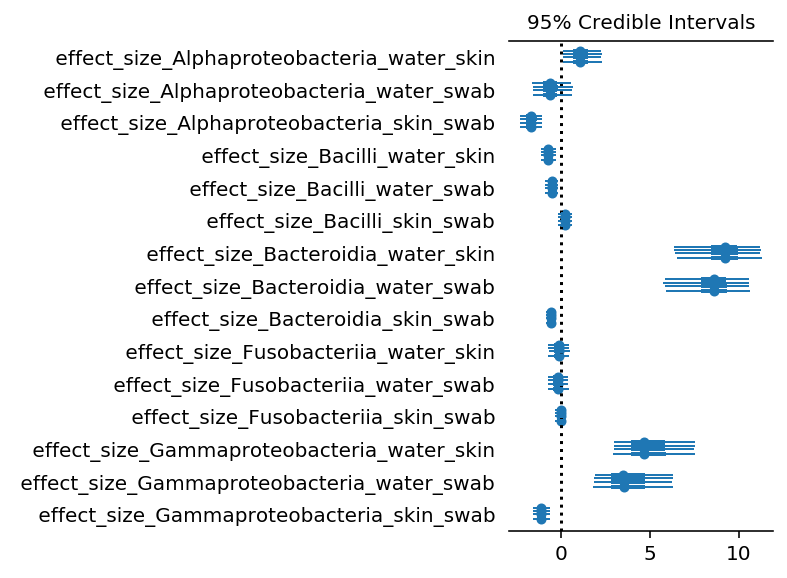

In [65]:
varnames = sorted([i for i in trace.varnames if i.startswith('effect')], key=lambda k: k.split('_')[2])

pm.forestplot(
    trace, 
    varnames=varnames,
    rhat=False,
      
    
)

In [66]:
significance = pd.DataFrame(columns=['Swab_modal_Mu',
                                     'Swab_average_rel_abund',
                                     'Swab_0.05_quantile', 
                                     'Swab_0.95_quantile', 
                                     'Skin_modal_Mu', 
                                     'Skin_average_rel_abund',
                                     'Skin_0.05_quantile', 
                                     'Skin_0.95_quantile',
                                     'Overlapping_95CI',
                                     'p-value-for_Mu_posterior',
                                     'p-value-for-rel-abund-dist'])

for c in classes:
    swab = 'mu_swab_%s' % c
    skin = 'mu_skin_%s' % c
    if not all([i in trace.varnames for i in (swab,skin)]):
        continue
    swab_mus = trace.get_values(swab, chains=1, burn=int(0.2*len(trace)))
    skin_mus = trace.get_values(skin, chains=1, burn=int(0.2*len(trace)))
    
    swab_quantiles = np.quantile(swab_mus, [0.05,0.95])
    skin_quantiles = np.quantile(skin_mus, [0.05,0.95])
    
    ol = False
    
    if swab_quantiles[0] <= skin_quantiles[0] <= swab_quantiles[1] or swab_quantiles[0] <= skin_quantiles[1] <= swab_quantiles[1]:
        ol = True
        
    u, p = mannwhitneyu(swab_mus, skin_mus)
    
    u1, p1 = mannwhitneyu(narrow3.loc[((narrow3.Class==c) & (narrow3.Type=='swab'))]['RelAbund'].tolist(),
                 narrow3.loc[((narrow3.Class==c) & (narrow3.Type=='skin'))]['RelAbund'].tolist())
    
        
    significance.loc[c] = [mode([round(i,3) for i in  swab_mus])[0][0],
                           mode([round(i,3) for i in  narrow3.loc[((narrow3.Class==c) & (narrow3.Type=='swab'))]['RelAbund'].tolist()])[0][0],
                           round(swab_quantiles[0],3),
                           round(swab_quantiles[1],3),
                           mode([round(i,3) for i in  skin_mus])[0][0],
                           mode([round(i,3) for i in  narrow3.loc[((narrow3.Class==c) & (narrow3.Type=='skin'))]['RelAbund'].tolist()])[0][0],
                           round(skin_quantiles[0],3),
                           round(skin_quantiles[1],3),
                           ol,
                           round(p,3),round(p1,3)
                          ]
    
    
significance

,Swab_modal_Mu,Swab_average_rel_abund,Swab_0.05_quantile,Swab_0.95_quantile,Skin_modal_Mu,Skin_average_rel_abund,Skin_0.05_quantile,Skin_0.95_quantile,Overlapping_95CI,p-value-for_Mu_posterior,p-value-for-rel-abund-dist
Bacilli,0.026,0.000,0.020,0.034,0.036,0.0,0.026,0.047,True,0.0,0.080
Fusobacteriia,0.021,0.000,0.015,0.028,0.019,0.0,0.012,0.027,True,0.0,0.301
Gammaproteobacteria,0.094,0.070,0.085,0.102,0.042,0.0,0.032,0.054,False,0.0,0.000
Alphaproteobacteria,0.123,0.049,0.110,0.134,0.045,0.0,0.034,0.059,False,0.0,0.003
Bacteroidia,0.032,0.000,0.026,0.040,0.005,0.0,0.001,0.010,False,0.0,0.000
